# 单资产预测

In [54]:
import datautils
from ts2vec import TS2Vec
import tasks.forecasting as f
import pandas as pd
import sys
import torch
import seaborn as sns
sys.path.append(r'D:\home\GitHub\ts2vec\datasets')

In [145]:
raw_data_path = r'D:\home\GitHub\ts2vec\datasets\single_stocks_dataset.csv'  # 原始数据

## 加载&下有任务训练

#### 加载数据集

In [70]:
data, train_slice, valid_slice, test_slice, scaler, pred_lens, n_covariate_cols = datautils.load_forecast_csv('single_stocks_dataset')

D:\home\GitHub\ts2vec\datautils.py:133: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  dt.weekofyear.to_numpy(),


#### 加载模型

In [56]:
model = TS2Vec(
    input_dims=data.shape[2],
    device='cuda',
    output_dims=128,
    max_train_length=300,
    hidden_dims=64,
    depth=6,
    batch_size=16,
)
model.load(r'D:\home\GitHub\ts2vec\examination\single_stocks_dataset')

#### 预测问题评估

In [57]:
out_log, eval_res = f.eval_forecasting(model,data, train_slice, valid_slice, test_slice, scaler, [24], n_covariate_cols) # pred_lens

step1
step2
step3
step4


## 特征表现分析

In [305]:
# 相关性分析函数
def corr_analysis(data_table, target_feature=None, plot_heatmap=False):
    """
    data_table-->pandas.DataFrame: 用于分析相关性的表格
    target_feature-->Union(None, list): 用来选择计算相关性的特征
    return:
    """
    if target_feature is not None:
        data_table = data_table.loc[:,target_feature]
    if plot_heatmap: #热力图
        figsize = min(len(data_table.columns)/2,28)
        sns.set_context({"figure.figsize":(figsize,figsize)})
        sns.heatmap(abs(data_table.corr()),vmin=0,vmax=1,cmap="RdBu_r")
        plt.show()
    else: # 返回相关系数矩阵
        return data_table.corr()

#特征相关性排序
def corr_sort_by_feature(data_table,abs_value=True, by='turnover_rate', num=20):
    table = data_table.corr()
    if abs_value:
        table = table.abs()
    table = table.sort_values(by=by, ascending=False).head(num).loc[:,by]
    return table

#计算滚动IC
def IC_IR_plot(shifted_table, return_ratio='return_ratio',window=50,mean_window=400, target_feature=None):
    for feature in target_feature:
        table = shifted_table.loc[:,[return_ratio, feature]]
        table = table.iloc[:,0].rolling(window).corr(table.iloc[:,1])
        table_mean = table.rolling(mean_window).mean()
        table_std = table.rolling(window=200).std()
        icir = table_mean/table_std
        plt.plot(table)
        plt.plot(table_mean)
        plt.plot(icir)
        plt.show()

#draw timing plot
def draw_timing(target_table, feature,return_ratio='return_ratio', value=0.):
    
    if 'date' in shifted_table.columns:
        target_table.date = pd.to_datetime(target_table.date)
        target_table = target_table.set_index(['date'])
    timing_table = target_table.copy()
    timing_table[return_ratio][timing_table[feature]<timing_table[feature].mean()]=0
    plt.figure(figsize=(12,8))
    plt.title('timing test')
    plt.plot((target_table[return_ratio]+1).cumprod(),color='green',linestyle='dashed', label='benchmark')
    plt.plot((timing_table[return_ratio]+1).cumprod(),color='red',label='timing')
    plt.lengend()
    plt.show()
    
    

#特征择时测试
def feature_timing(shifted_table, return_ratio='return_ratio',target_feature=None, value=0):

    if type(list(target_feature))==list:
        for feature in target_feature:
            columns = [return_ratio, feature]
            if 'date' in shifted_table.columns:
                columns = ['date', return_ratio, feature]
            target_table = shifted_table.loc[:,columns]
            draw_timing(target_table, feature, return_ratio=return_ratio, value=value)

            
            
            
            
    

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


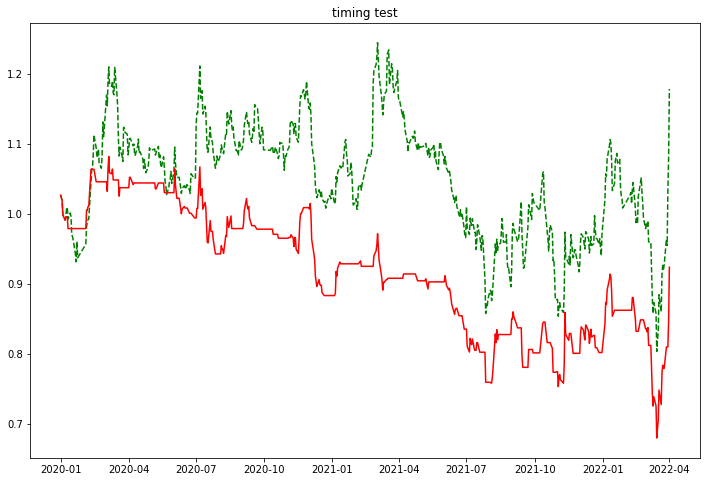

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


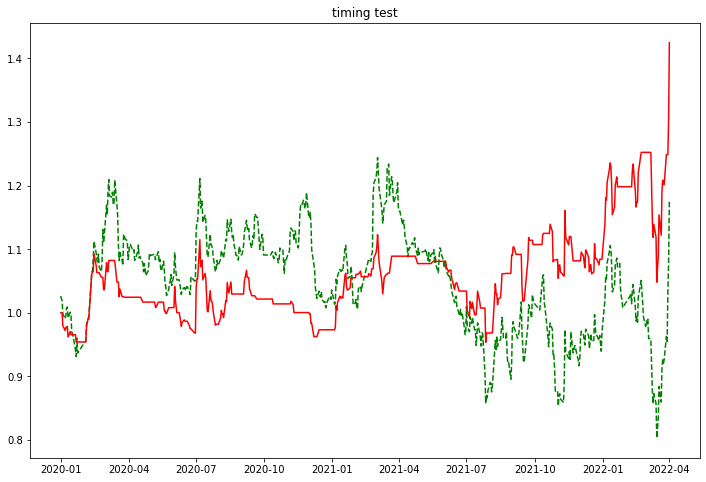

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


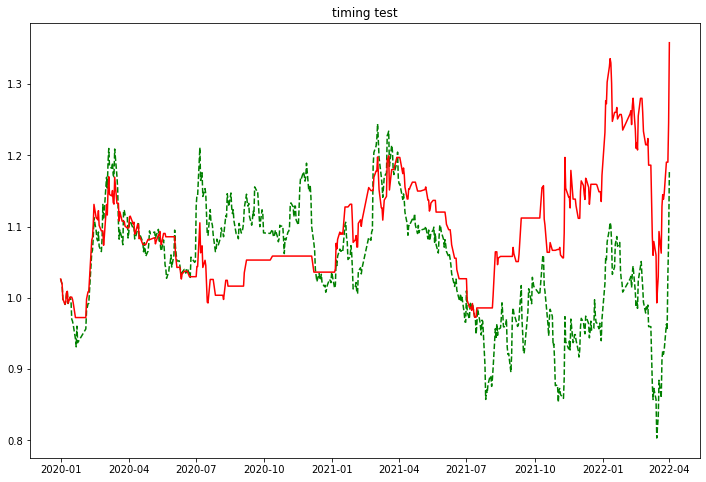

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


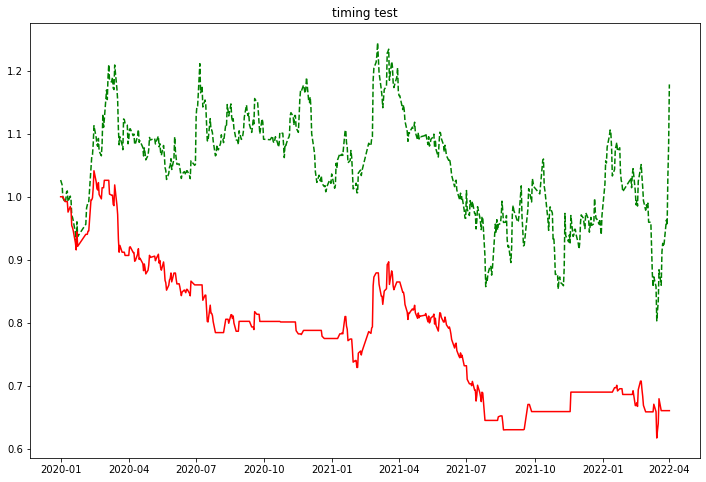

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


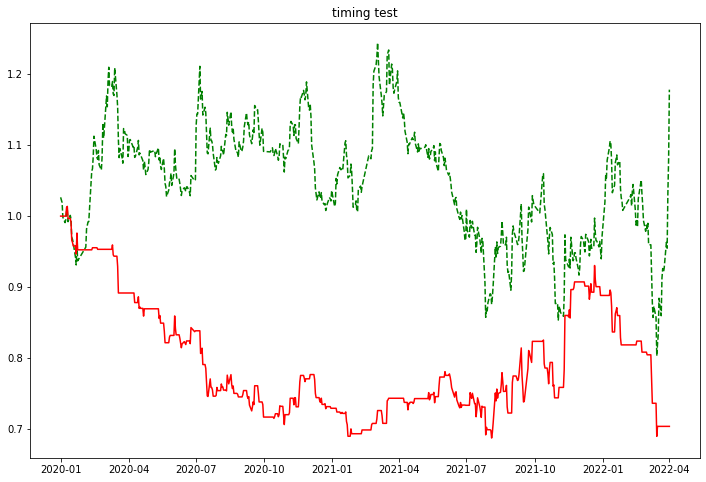

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


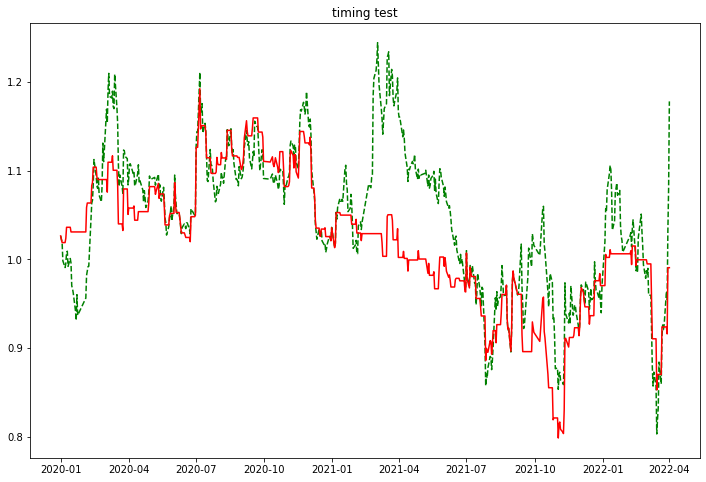

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


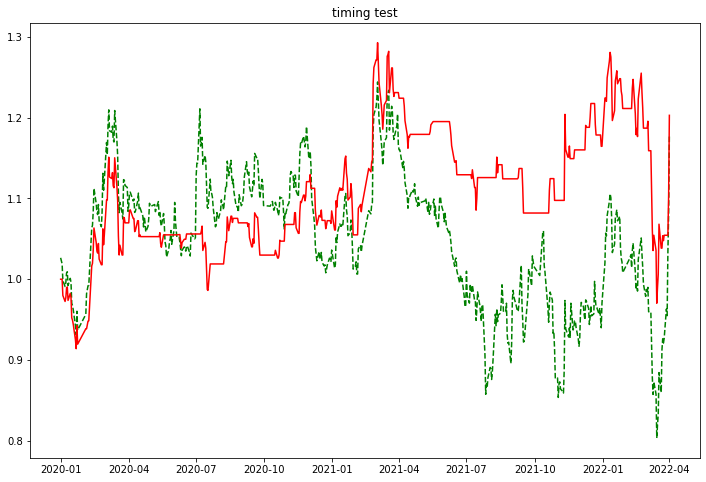

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


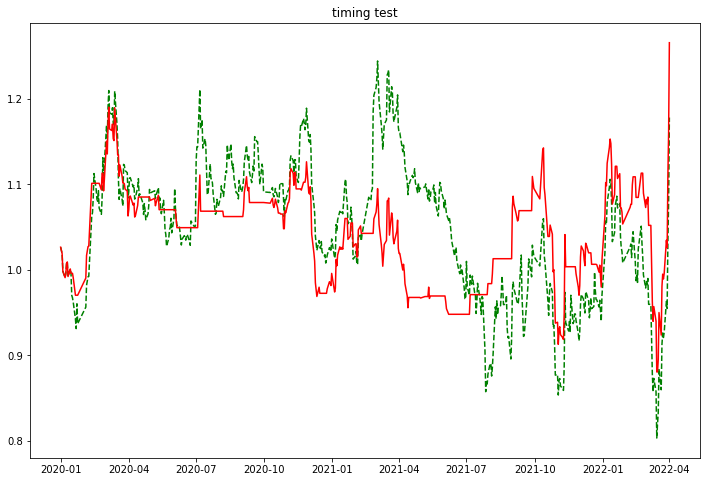

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


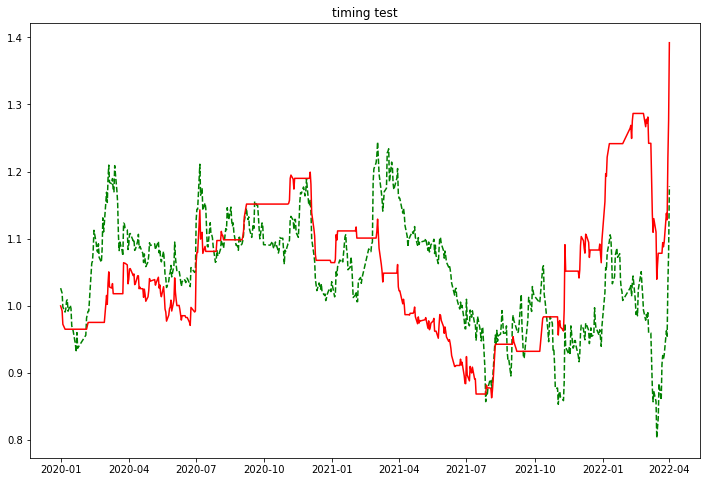

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


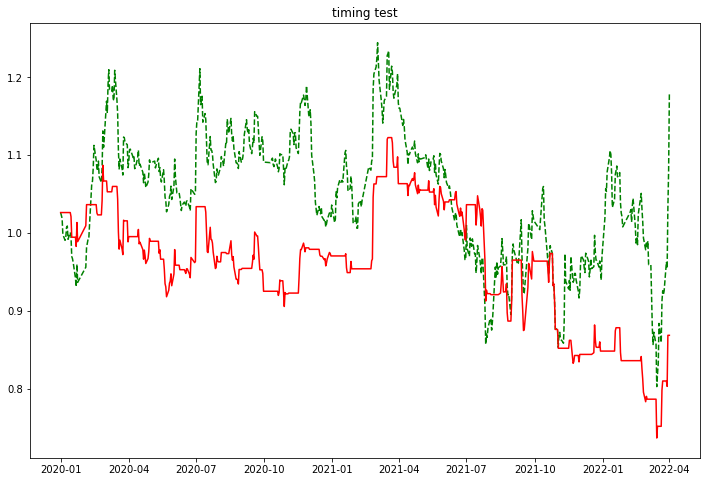

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


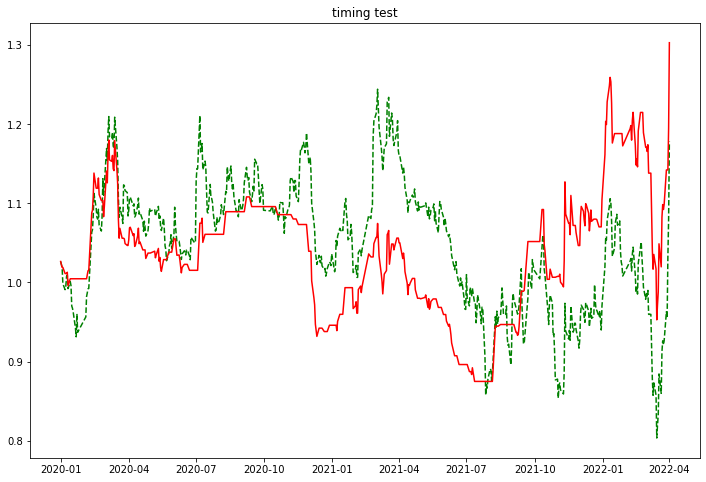

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


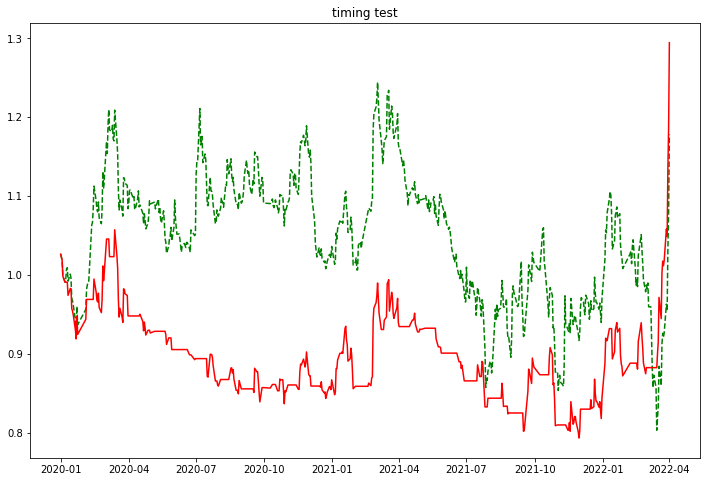

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


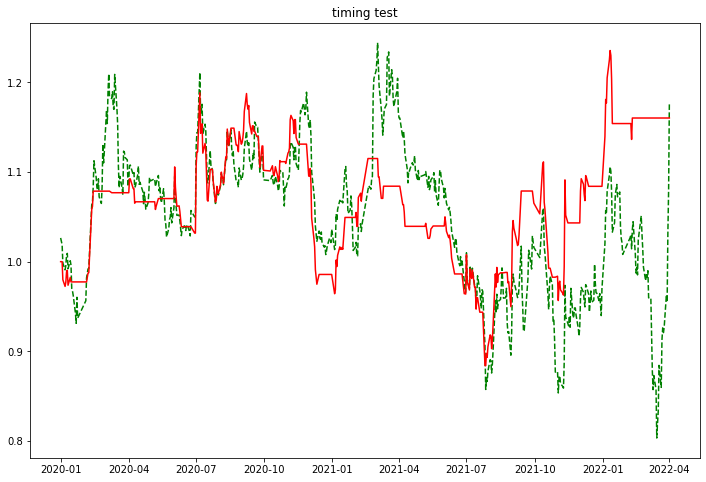

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


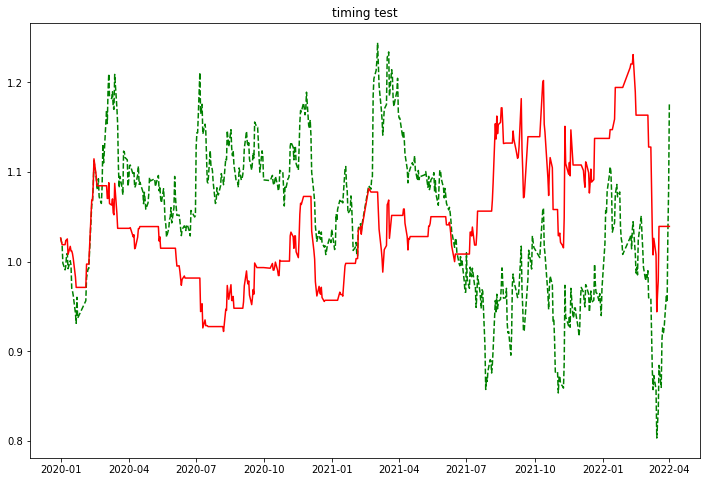

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


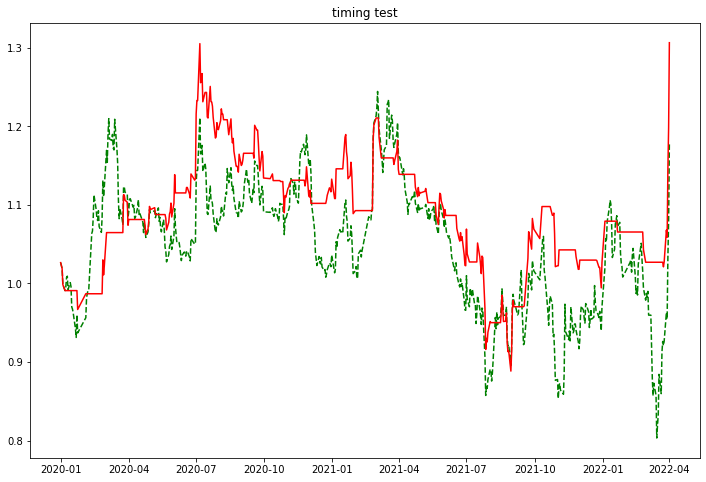

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


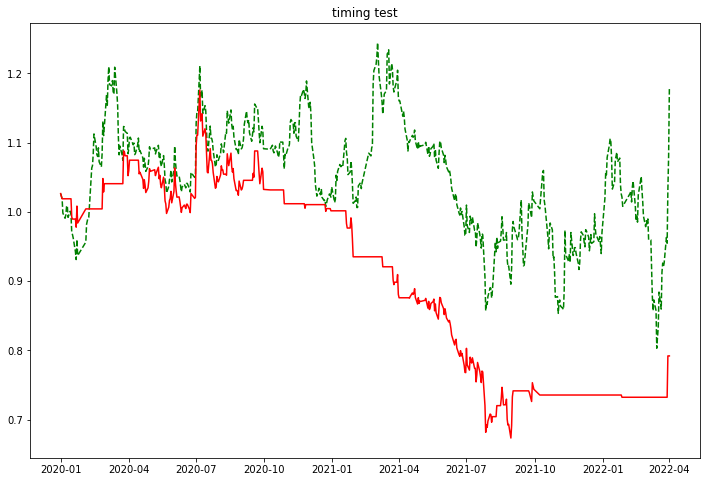

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


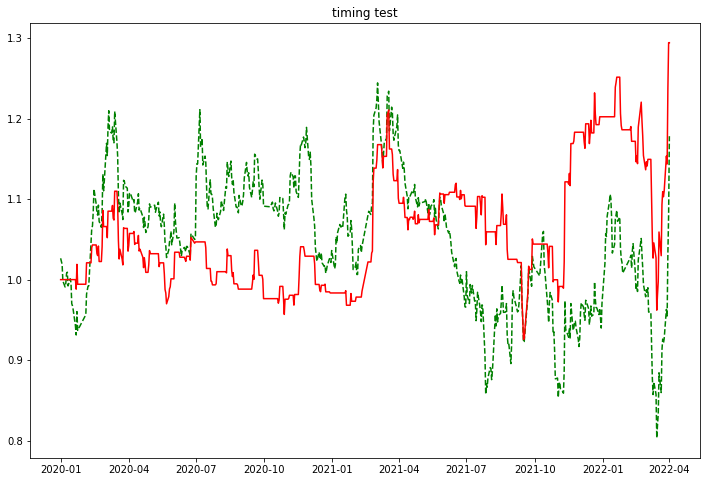

D:\Program Files (x86)\Anaconda\envs\py37\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


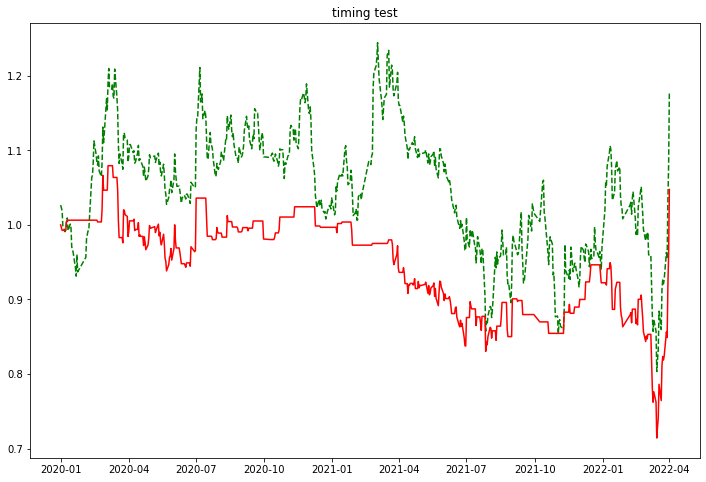

In [310]:
feature_timing(shifted_table.iloc[2187:,:], return_ratio='return_ratio',target_feature=feature, value=0.)

#### 特征提取

In [146]:
raw_data = pd.read_csv(raw_data_path)
all_repr = model.encode(data, casual=True, sliding_length=1, sliding_padding=200, batch_size=256) #得到特征表征
feature_table = pd.concat([raw_data, pd.DataFrame(all_repr[0,:,:])], axis=1)

#### 因子预测能力

In [152]:
shifted_table = feature_table.copy()
shifted_table.loc[:,raw_data.columns] = shifted_table.loc[:,raw_data.columns].shift(-1)

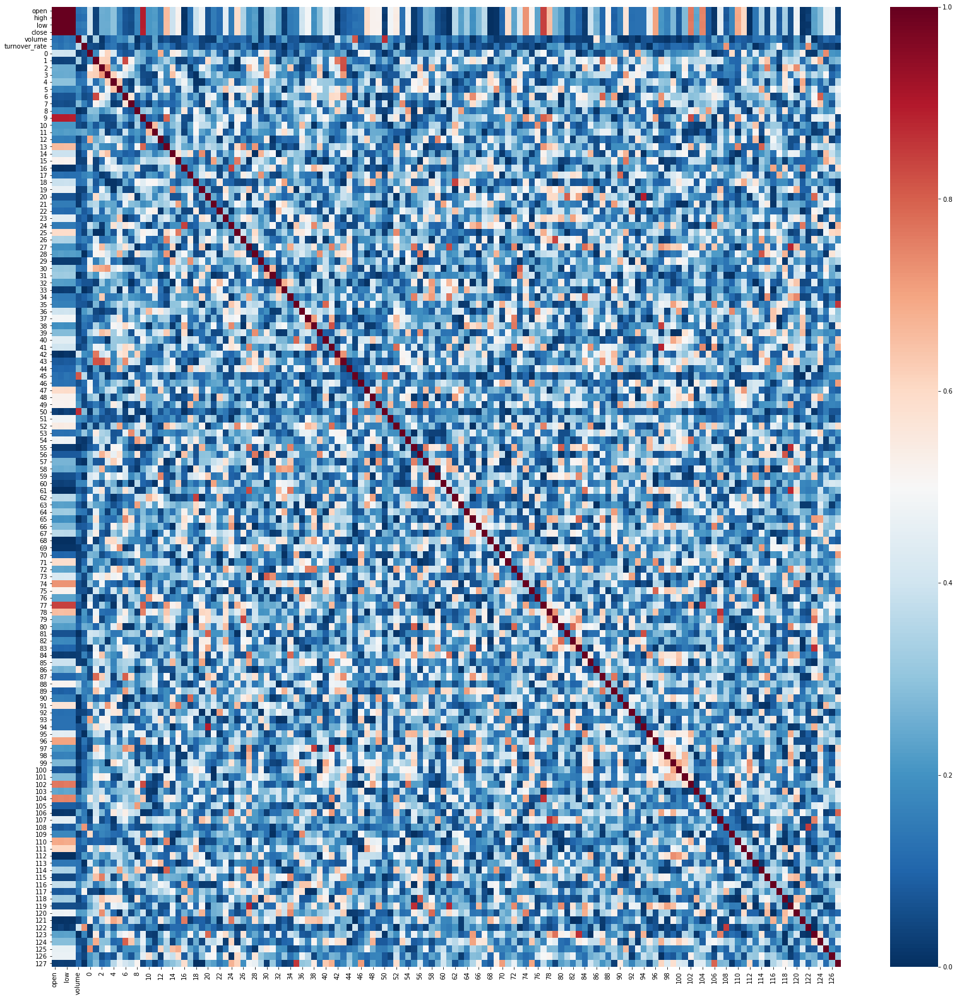

In [151]:
corr_analysis(shifted_table, target_feature=None, plot_heatmap=True)  # 总体相关性

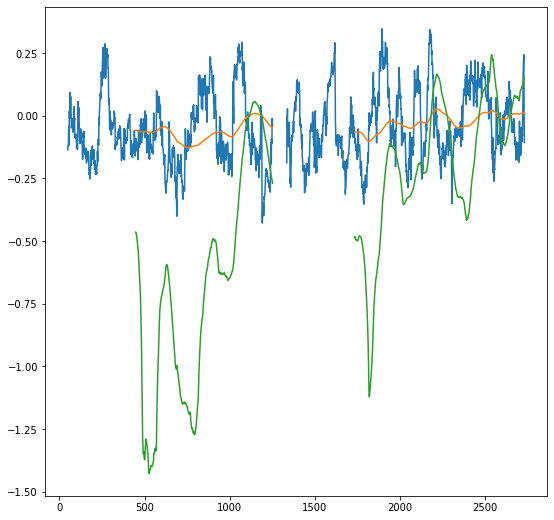

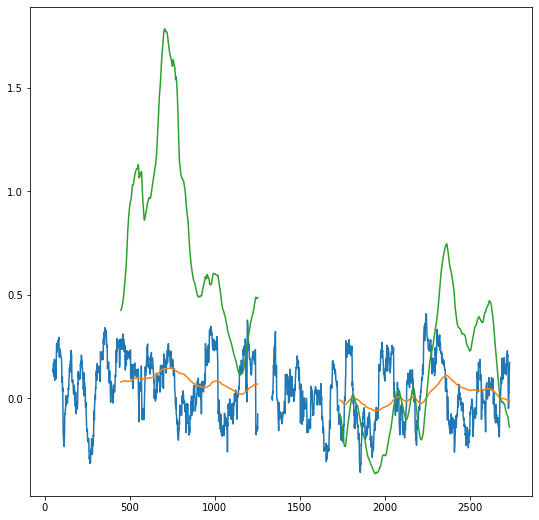

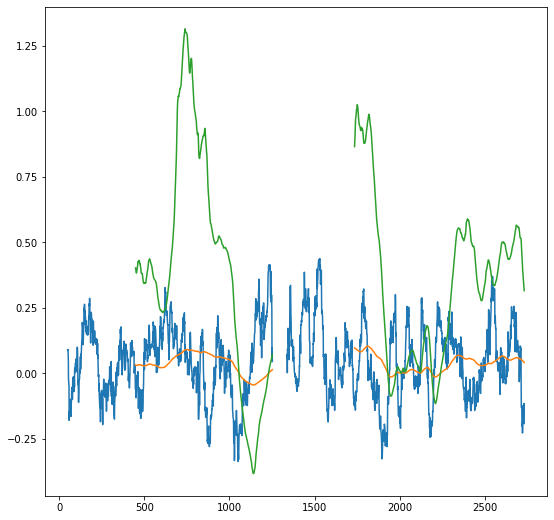

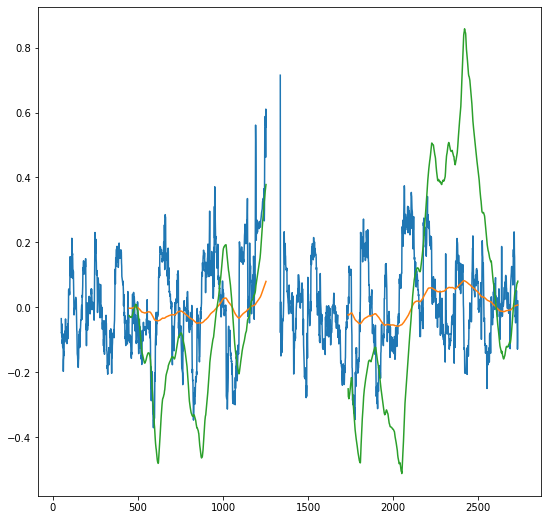

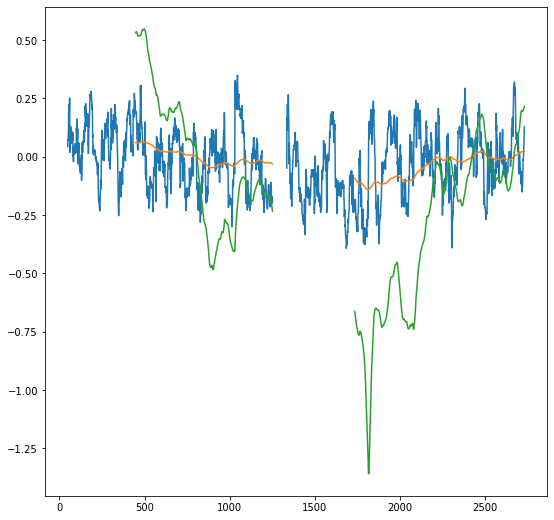

...

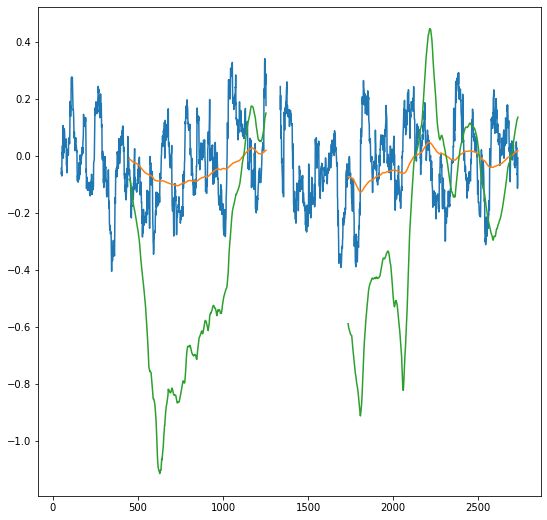

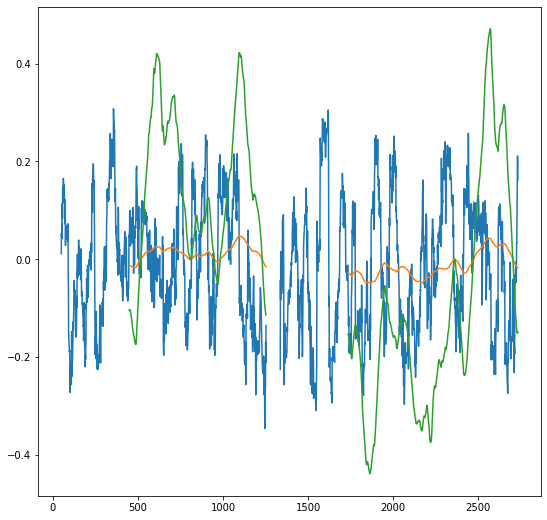

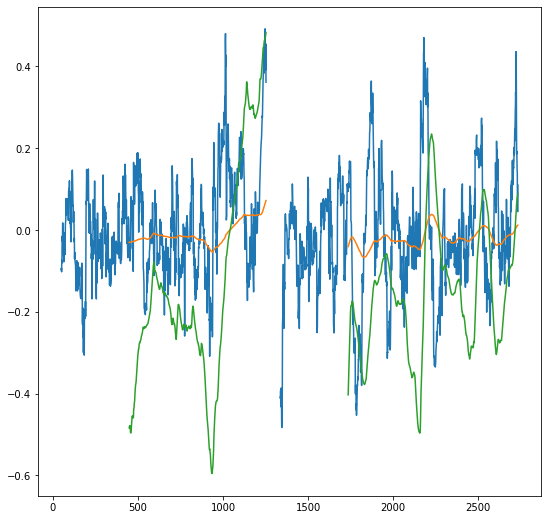

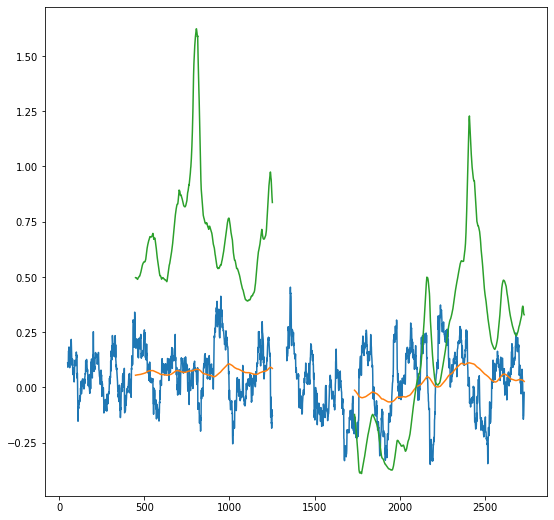

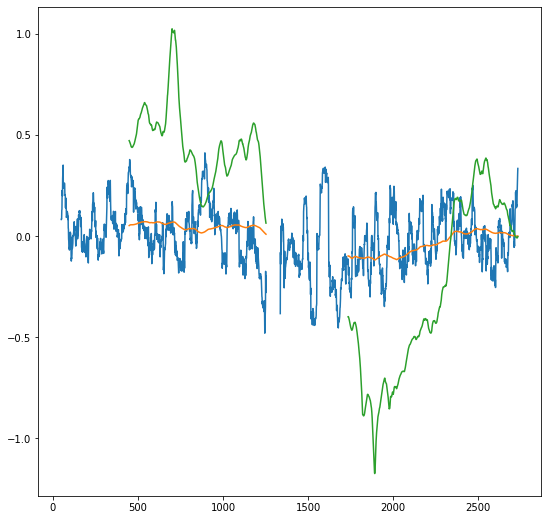

In [197]:
IC_IR_plot(shifted_table, target_feature=feature)

In [158]:
corr_sort_by_feature(shifted_table, by='return_ratio', num=20)

return_ratio     1.000000
turnover_rate    0.200723
103              0.077004
46               0.056112
60               0.052792
108              0.051063
118              0.050896
12               0.050370
volume           0.048852
122              0.047151
70               0.045904
42               0.045580
8                0.045193
113              0.045166
71               0.044456
127              0.043109
84               0.040148
31               0.039528
109              0.039363
120              0.038647
Name: return_ratio, dtype: float64

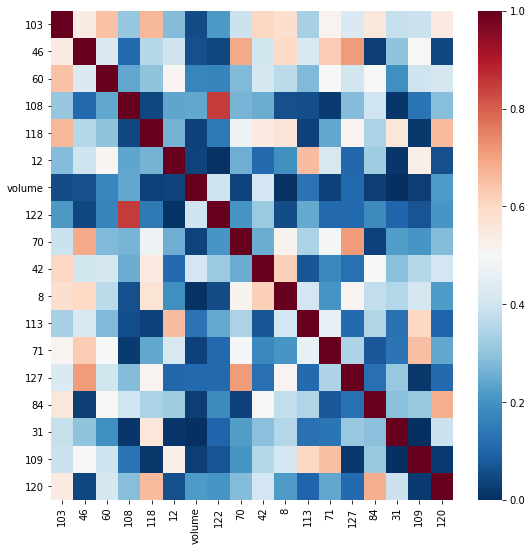

In [156]:
shifted_table['return_ratio'] = shifted_table.close/shifted_table.open-1  # 构建收益率指标
feature = corr_sort_by_feature(shifted_table, by='return_ratio', num=20).index[2:]  # 提取与收益率指标最相关的特征
print(feature)
corr_analysis(shifted_table, target_feature=feature, plot_heatmap=True)  # 与收益率相关性相关性

#### 特征提取表现

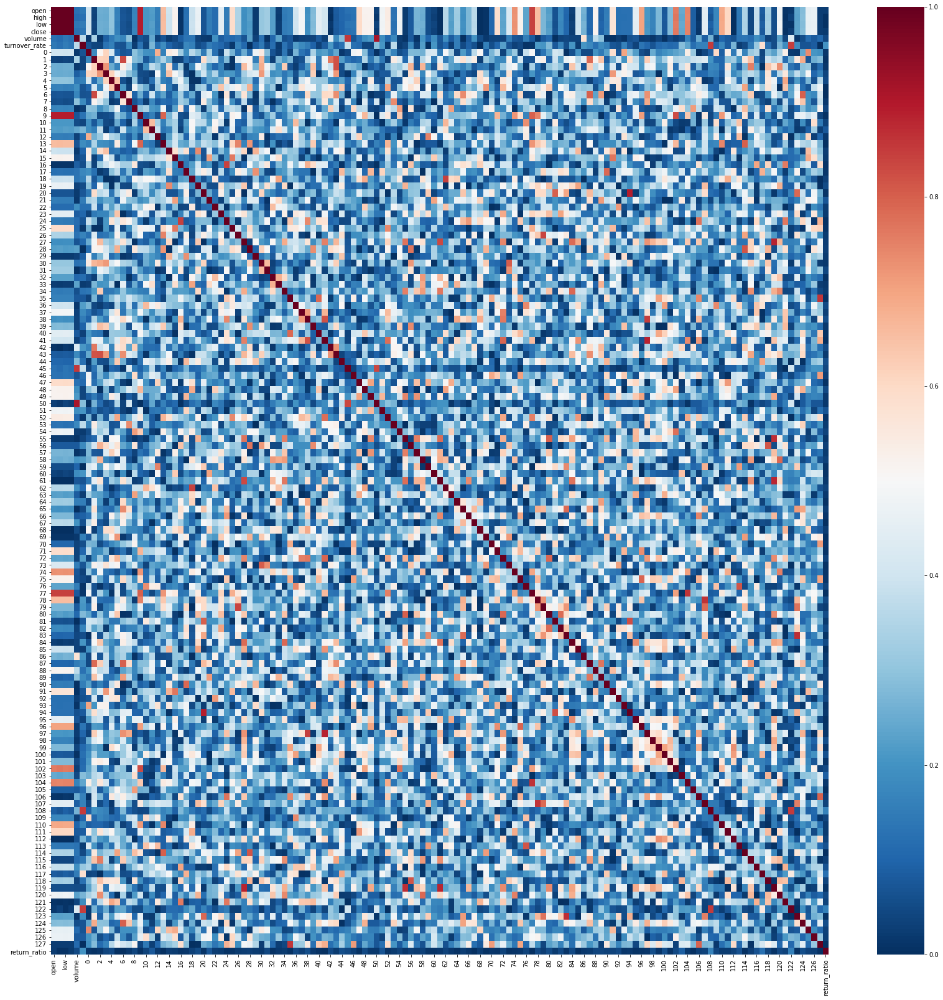

In [199]:
corr_analysis(feature_table, target_feature=None, plot_heatmap=True)  # 总体相关性

Index([108, 122, 117, 103, 11, 21, 51, 113, 116, 100, 44, 38, 124, 98, 80, 19,
       48, 102],
      dtype='object')


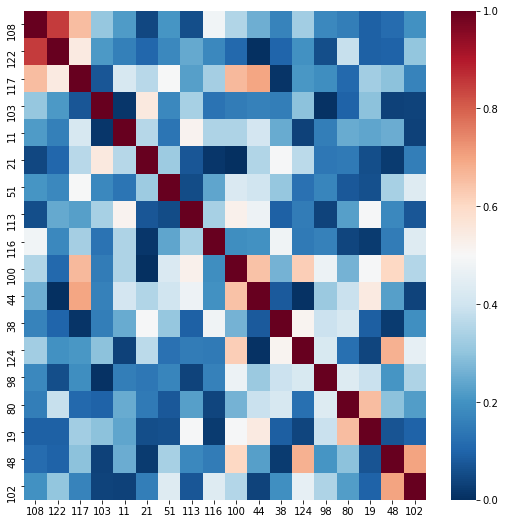

In [200]:
feature_table['return_ratio'] = feature_table.close/feature_table.open-1  # 构建收益率指标
feature = corr_sort_by_feature(feature_table, by='return_ratio', num=20).index[2:]  # 提取与收益率指标最相关的特征
print(feature)
corr_analysis(feature_table, target_feature=feature, plot_heatmap=True)  # 与收益率相关性相关性

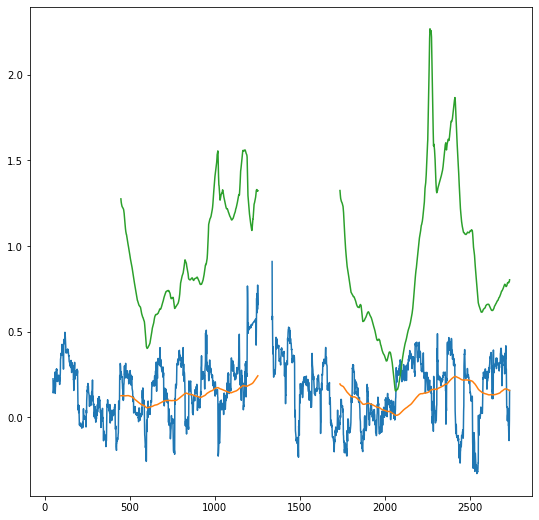

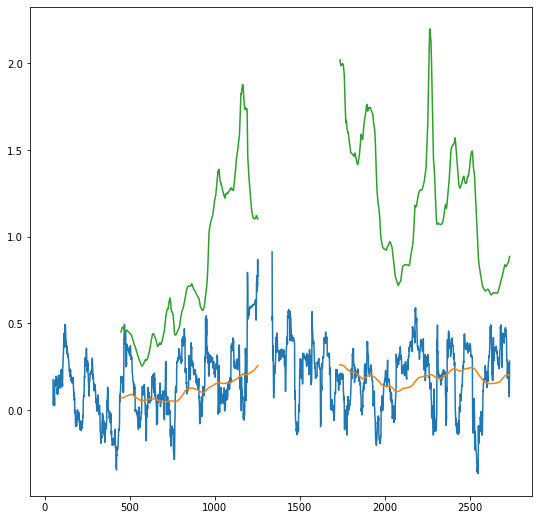

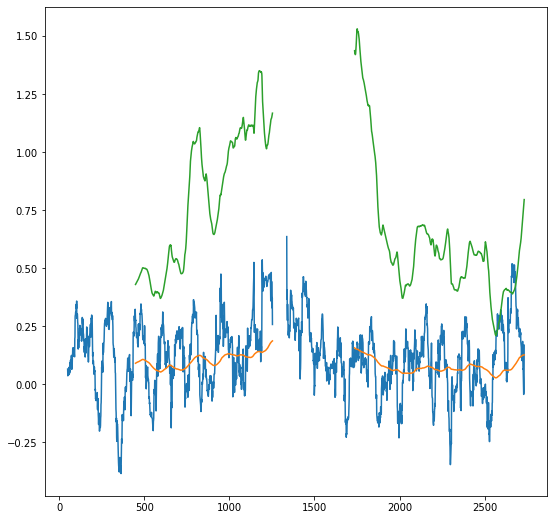

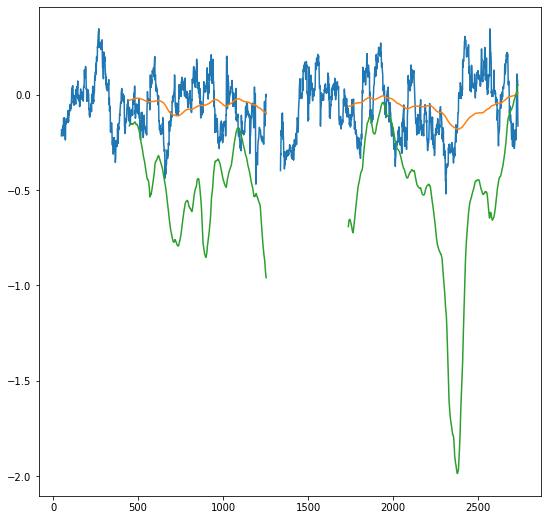

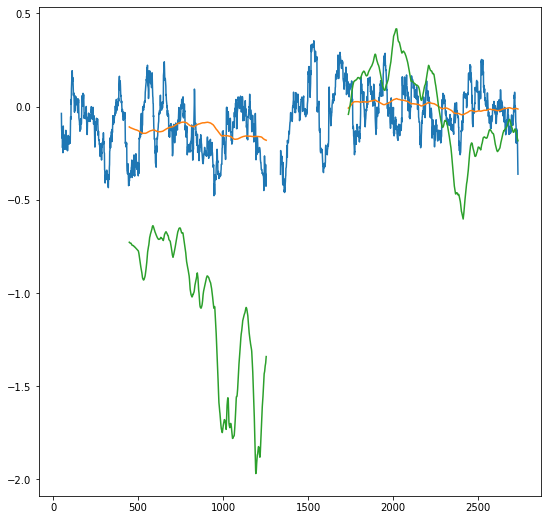

...

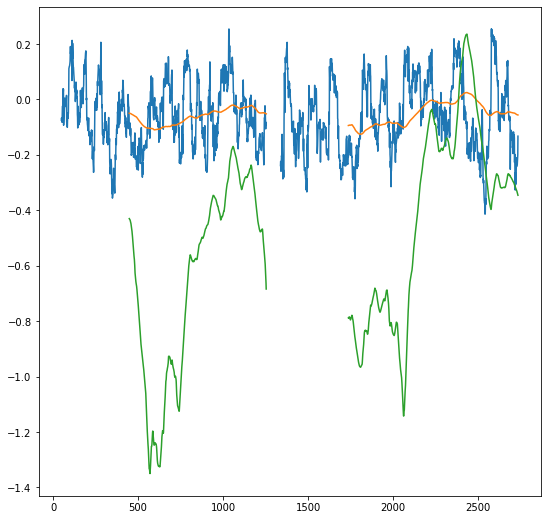

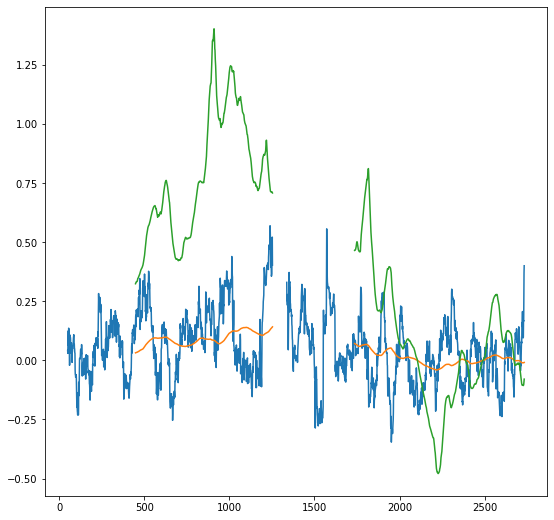

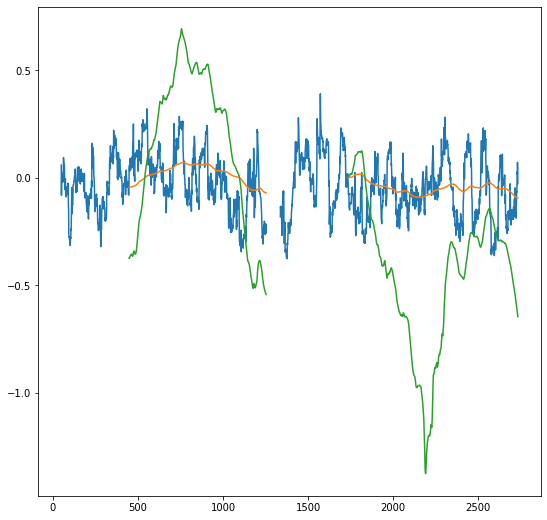

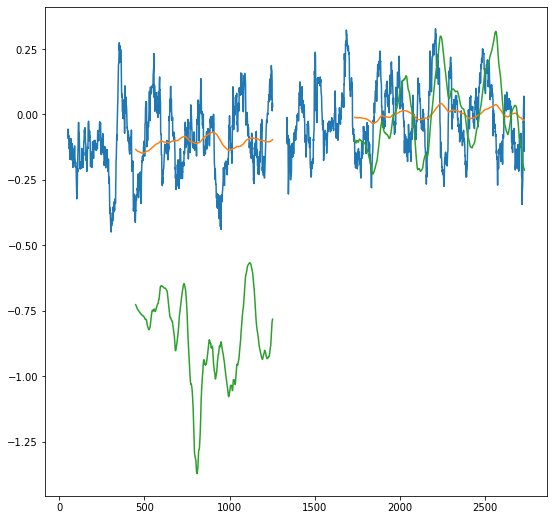

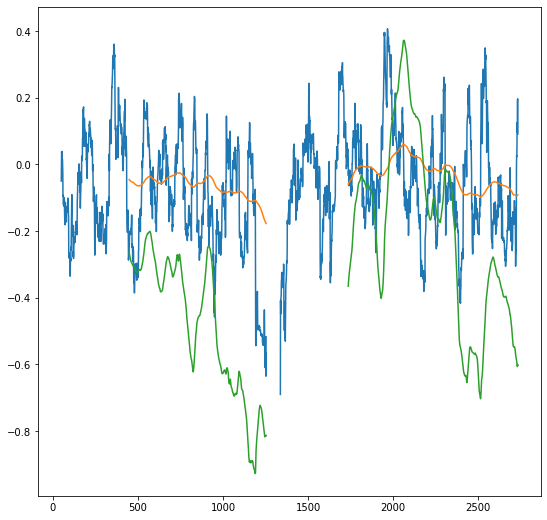

In [201]:
IC_IR_plot(feature_table, target_feature=feature)

#### 预测表现

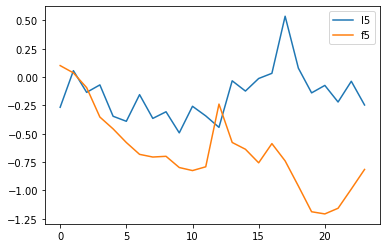

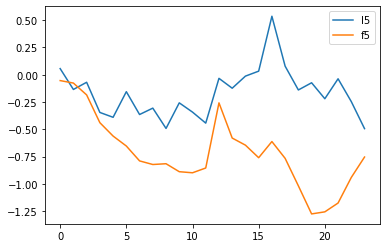

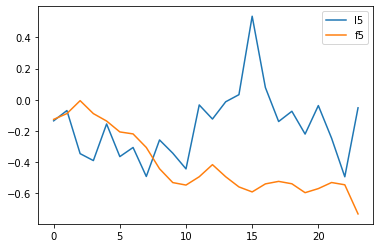

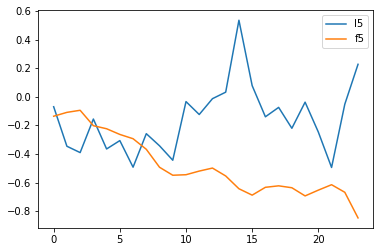

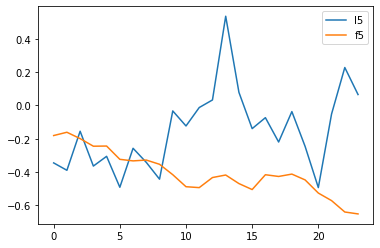

...

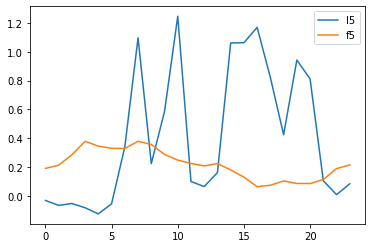

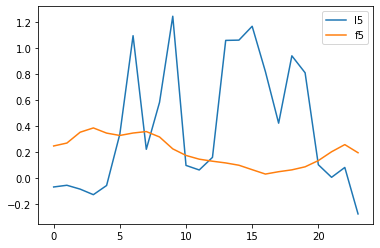

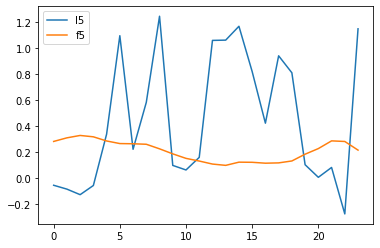

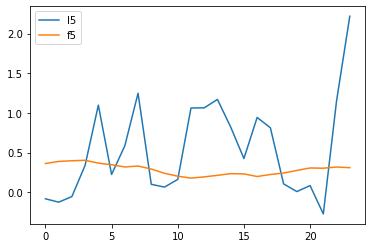

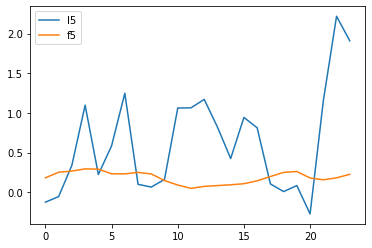

In [65]:
import matplotlib.pyplot as plt
for i in range(0,out_log[24]['norm_gt'].shape[1]):
    label = pd.DataFrame(out_log[24]['norm_gt'][0][i],index=None)   
    label.columns=['l{}'.format(i) for i in range(len(label.columns))]
    forecast = pd.DataFrame(out_log[24]['norm'][0][i],index=None)
    forecast.columns=['f{}'.format(i) for i in range(len(forecast.columns))]
    result = pd.merge(label,forecast,how='left',right_index = True,left_index=True)
    result[['l5','f5']].plot()
    plt.show()
    plt.close()